In [42]:
import numpy as np
import cupy as cp
import astropy.units as u
from astropy.io import fits
from matplotlib.patches import Rectangle, Circle
from pathlib import Path
from IPython.display import clear_output
from importlib import reload
import time

import logging, sys
poppy_log = logging.getLogger('poppy')
poppy_log.setLevel('INFO')
logging.basicConfig(stream=sys.stdout, level=logging.INFO)

poppy_log.disabled = True

import warnings
warnings.filterwarnings("ignore")

import cgi_phasec_poppy as cgi
from cgi_phasec_poppy import misc

from wfsc import iefc_2dm as iefc
from wfsc import utils

dm_dir = cgi.data_dir/'dm-acts'

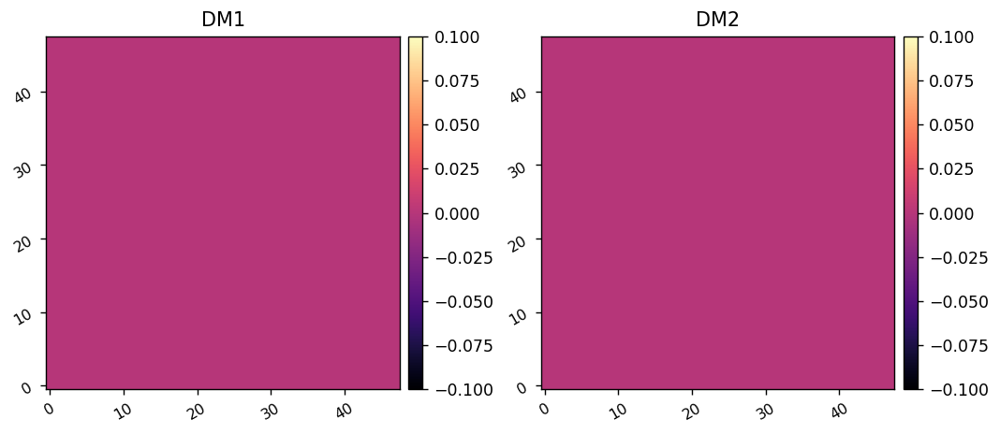

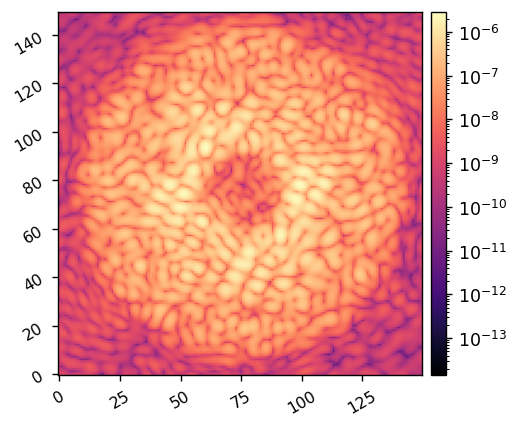

In [43]:
reload(cgi)
sysi = cgi.CGI(cgi_mode='spc-wide', npsf=150,
              use_fpm=True,
              use_pupil_defocus=False, 
              polaxis=0,
              use_opds=True,
             )
sysi.show_dms()

npsf = sysi.npsf
Nact = sysi.Nact

ref_psf = sysi.snap()

misc.myimshow(ref_psf, lognorm=True)

# Create dark hole ROI to calibrate and control

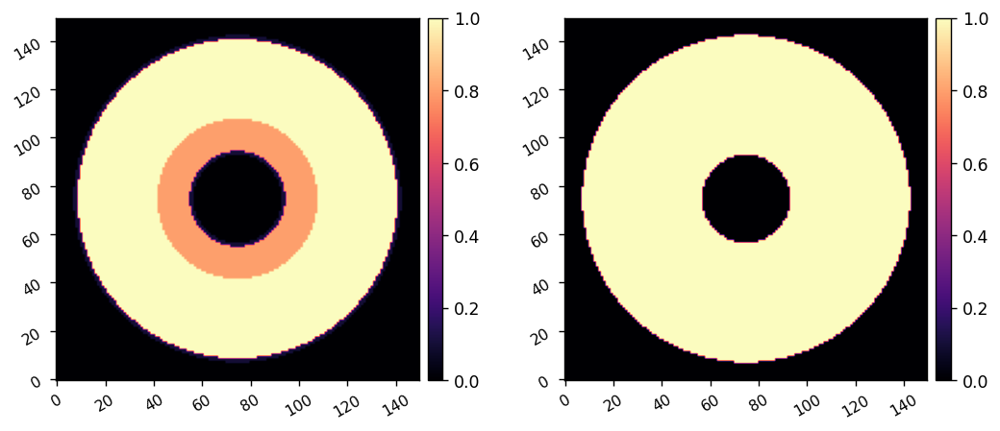

In [3]:
reload(utils)
xfp = (np.linspace(-npsf/2, npsf/2-1, npsf) + 1/2)*sysi.psf_pixelscale_lamD
fpx,fpy = np.meshgrid(xfp,xfp)
fpr = np.sqrt(fpx**2 + fpy**2)
    
iwa = 5.5
owa = 20.5
regions = [iwa, 6, 10, 20, owa]
weights = [0.1, 0.8, 1, 0.1]
weight_map = np.zeros((sysi.npsf,sysi.npsf), dtype=np.float64)
for i in range(len(weights)):
    roi_params = {
        'inner_radius' : regions[i],
        'outer_radius' : regions[i+1],
        'edge_position' : 0,
        'rotation':0,
        'full':True,
    }
    roi = utils.create_annular_focal_plane_mask(fpx, fpy, roi_params)
    weight_map += roi*weights[i]

control_mask = weight_map>0
misc.myimshow2(weight_map, control_mask)

probe_amp = 3e-8
calib_amp = 5e-9

# Create probe and fourier modes

(1732, 2304) (866, 2)


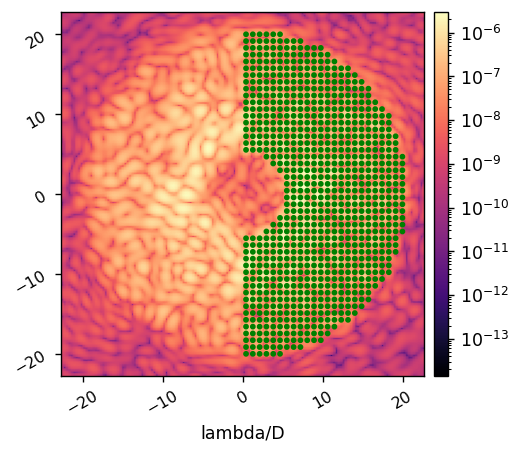

In [46]:
reload(utils)
fourier_modes, fs = utils.select_fourier_modes(sysi, control_mask*(fpx>0), fourier_sampling=0.85) 
nf = fourier_modes.shape[0]
print(fourier_modes.shape, fs.shape)

patches = []
for f in fs:
    center = (f[0], f[1])
    radius = 0.25
    patches.append(Circle(center, radius, fill=True, color='g'))
    
misc.myimshow(ref_psf, lognorm=True, pxscl=sysi.psf_pixelscale_lamD, patches=patches)

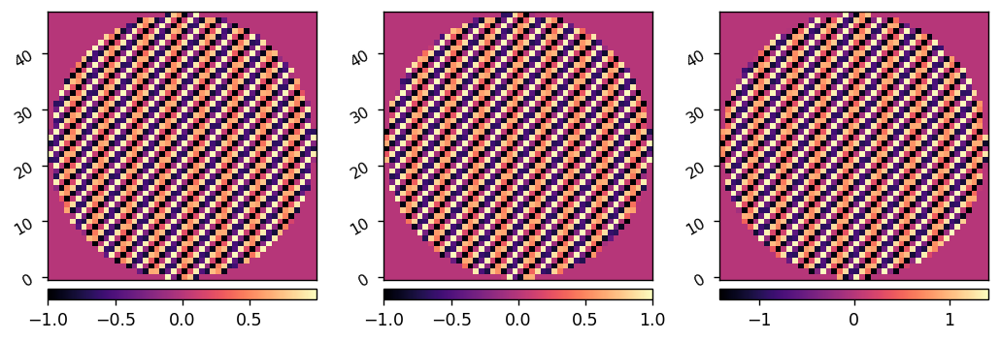

In [50]:
cos_modes = fourier_modes[:nf//2]
sin_modes = fourier_modes[nf//2:]

for i in range(cos_modes.shape[0]):
    try:
        misc.myimshow3(cos_modes[i].reshape(Nact,Nact), sin_modes[i].reshape(Nact,Nact),
                       cos_modes[i].reshape(Nact,Nact)-sin_modes[i].reshape(Nact,Nact))
        clear_output(wait=True)
        time.sleep(0.1)
    except KeyboardInterrupt:
        break

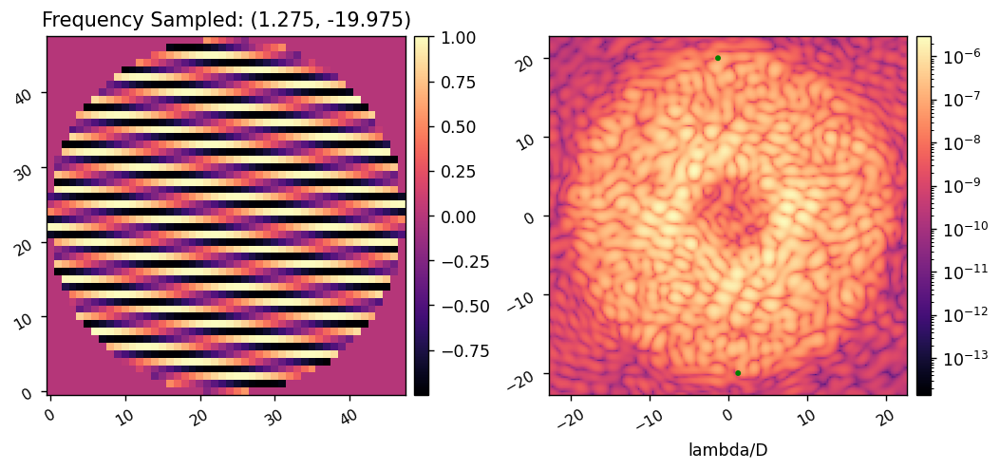

In [47]:
import time
for i in range(nf//2):
    try:
        misc.myimshow2(fourier_modes[i].reshape(Nact,Nact), ref_psf, 
                       'Frequency Sampled: ({:.3f}, {:.3f})'.format(fs[i][0], fs[i][1]),
                       lognorm2=True,
                       pxscl2=sysi.psf_pixelscale_lamD, 
                       patches2=[Circle(fs[i], 0.25, fill=True, color='g'),
                                 Circle(-fs[i], 0.25, fill=True, color='g')])
        clear_output(wait=True)
        time.sleep(0.25)
    except KeyboardInterrupt:
        break

In [25]:
Nacts = int(sysi.dm_mask.sum())
Nacts

1780

In [53]:
reload(utils)
# had_modes = utils.get_hadamard_modes_1(sysi.dm_mask)
# had_modes_1 = had_modes[:1024]
# had_modes_2 = had_modes[1024:]
had_modes_1, had_modes_2 = utils.get_hadamard_modes_2(2*Nacts, sysi.dm_mask)
nh = had_modes.shape[0]
print(had_modes.shape, had_modes_1.shape)

(4096, 4096)


ValueError: shape mismatch: value array of shape (0,) could not be broadcast to indexing result of shape (1780,)

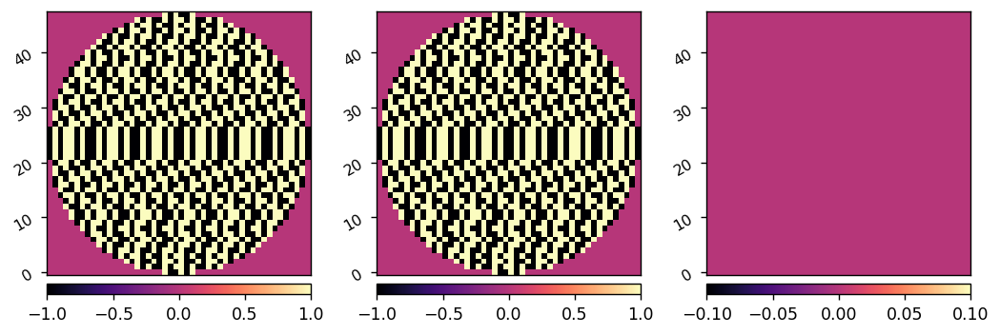

In [44]:
# for mode in had_modes:
#     try:
#         misc.myimshow(calib_amp*mode.reshape(Nact,Nact))
#         clear_output(wait=True)
#         time.sleep(0.1)
#     except KeyboardInterrupt:
#         break
        
for i in range(had_modes_1.shape[0]):
    try:
        misc.myimshow3(had_modes_1[i].reshape(Nact,Nact), had_modes_2[i].reshape(Nact,Nact),
                       had_modes_1[i].reshape(Nact,Nact)-had_modes_2[i].reshape(Nact,Nact))
        clear_output(wait=True)
        time.sleep(0.1)
    except KeyboardInterrupt:
        break

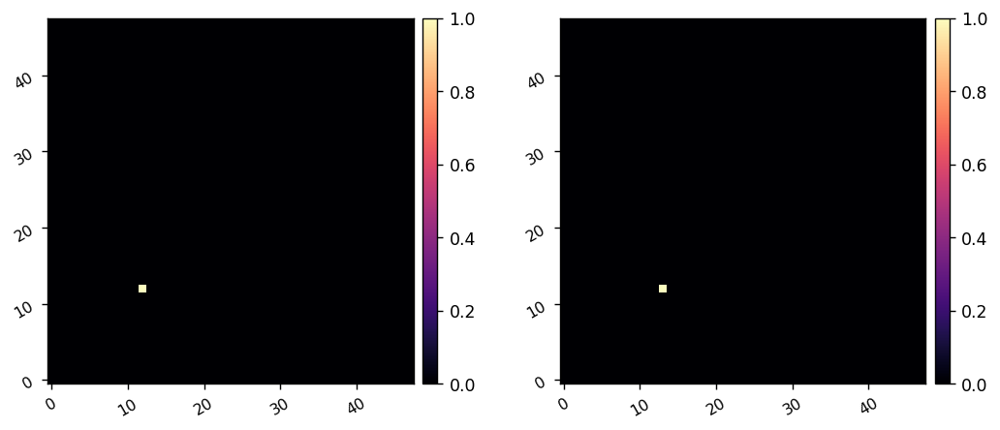

In [8]:
reload(iefc)
probe_modes = utils.create_probe_poke_modes(Nact, xinds=[Nact//4, Nact//4+1], yinds=[Nact//4, Nact//4], display=True)
# probe_modes = utils.create_fourier_probes(calib_modes, display_probes=True)

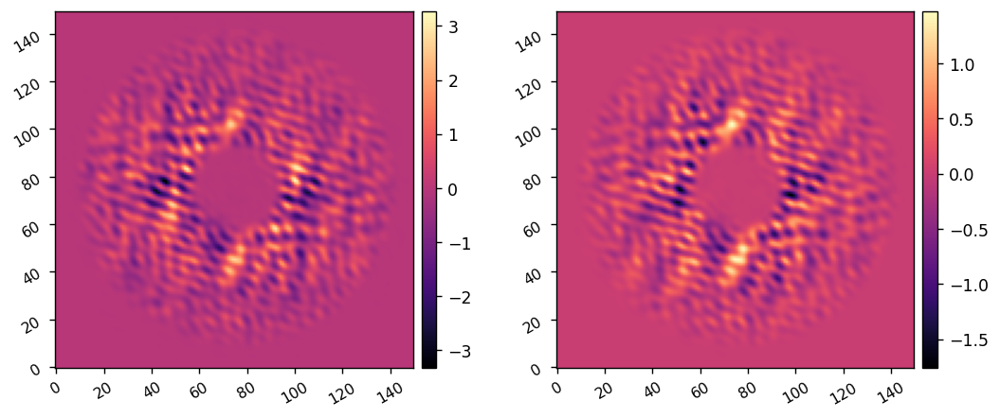

In [9]:
reload(iefc)
sysi.reset_dms()
differential_images, single_images = iefc.take_measurement(sysi, 
                                                           probe_modes, probe_amp, 
                                                           return_all=True, display=True)

# Calibrate IEFC (or load in previous calibration data)

In [18]:
reload(iefc)
sysi.reset_dms()
response_cube, calibration_cube = iefc.calibrate(sysi, 
                                                 probe_amp, probe_modes, 
                                                 calib_amp, fourier_modes, had_modes)

Calibrating I-EFC...
	Calibrated DM1 mode 1 / 516 in 2.643s
	Calibrated DM1 mode 2 / 516 in 5.170s
	Calibrated DM1 mode 3 / 516 in 7.699s
	Calibrated DM1 mode 4 / 516 in 10.233s
	Calibrated DM1 mode 5 / 516 in 12.850s
	Calibrated DM1 mode 6 / 516 in 15.429s
	Calibrated DM1 mode 7 / 516 in 17.956s
	Calibrated DM1 mode 8 / 516 in 20.496s
	Calibrated DM1 mode 9 / 516 in 23.029s
	Calibrated DM1 mode 10 / 516 in 25.584s
	Calibrated DM1 mode 11 / 516 in 28.233s
	Calibrated DM1 mode 12 / 516 in 30.772s
	Calibrated DM1 mode 13 / 516 in 33.317s
	Calibrated DM1 mode 14 / 516 in 35.866s
	Calibrated DM1 mode 15 / 516 in 38.411s
	Calibrated DM1 mode 16 / 516 in 40.953s
	Calibrated DM1 mode 17 / 516 in 43.498s
	Calibrated DM1 mode 18 / 516 in 46.044s
	Calibrated DM1 mode 19 / 516 in 48.586s
	Calibrated DM1 mode 20 / 516 in 51.133s
	Calibrated DM1 mode 21 / 516 in 53.674s
	Calibrated DM1 mode 22 / 516 in 56.297s
	Calibrated DM1 mode 23 / 516 in 58.841s
	Calibrated DM1 mode 24 / 516 in 61.386s
	Calibr

	Calibrated DM1 mode 195 / 516 in 499.656s
	Calibrated DM1 mode 196 / 516 in 502.203s
	Calibrated DM1 mode 197 / 516 in 504.758s
	Calibrated DM1 mode 198 / 516 in 507.318s
	Calibrated DM1 mode 199 / 516 in 509.867s
	Calibrated DM1 mode 200 / 516 in 512.483s
	Calibrated DM1 mode 201 / 516 in 515.144s
	Calibrated DM1 mode 202 / 516 in 517.670s
	Calibrated DM1 mode 203 / 516 in 520.312s
	Calibrated DM1 mode 204 / 516 in 522.856s
	Calibrated DM1 mode 205 / 516 in 525.564s
	Calibrated DM1 mode 206 / 516 in 528.105s
	Calibrated DM1 mode 207 / 516 in 530.643s
	Calibrated DM1 mode 208 / 516 in 533.180s
	Calibrated DM1 mode 209 / 516 in 535.726s
	Calibrated DM1 mode 210 / 516 in 538.258s
	Calibrated DM1 mode 211 / 516 in 540.796s
	Calibrated DM1 mode 212 / 516 in 543.335s
	Calibrated DM1 mode 213 / 516 in 546.091s
	Calibrated DM1 mode 214 / 516 in 548.631s
	Calibrated DM1 mode 215 / 516 in 551.174s
	Calibrated DM1 mode 216 / 516 in 553.715s
	Calibrated DM1 mode 217 / 516 in 556.248s
	Calibrated

	Calibrated DM1 mode 386 / 516 in 986.760s
	Calibrated DM1 mode 387 / 516 in 989.291s
	Calibrated DM1 mode 388 / 516 in 991.826s
	Calibrated DM1 mode 389 / 516 in 994.354s
	Calibrated DM1 mode 390 / 516 in 996.885s
	Calibrated DM1 mode 391 / 516 in 999.421s
	Calibrated DM1 mode 392 / 516 in 1001.943s
	Calibrated DM1 mode 393 / 516 in 1004.473s
	Calibrated DM1 mode 394 / 516 in 1007.003s
	Calibrated DM1 mode 395 / 516 in 1009.637s
	Calibrated DM1 mode 396 / 516 in 1012.169s
	Calibrated DM1 mode 397 / 516 in 1014.695s
	Calibrated DM1 mode 398 / 516 in 1017.225s
	Calibrated DM1 mode 399 / 516 in 1019.762s
	Calibrated DM1 mode 400 / 516 in 1022.285s
	Calibrated DM1 mode 401 / 516 in 1024.939s
	Calibrated DM1 mode 402 / 516 in 1027.473s
	Calibrated DM1 mode 403 / 516 in 1030.017s
	Calibrated DM1 mode 404 / 516 in 1032.555s
	Calibrated DM1 mode 405 / 516 in 1035.090s
	Calibrated DM1 mode 406 / 516 in 1037.626s
	Calibrated DM1 mode 407 / 516 in 1040.155s
	Calibrated DM1 mode 408 / 516 in 1042

	Calibrated DM2 mode 57 / 1024 in 1459.584s
	Calibrated DM2 mode 58 / 1024 in 1462.206s
	Calibrated DM2 mode 59 / 1024 in 1464.725s
	Calibrated DM2 mode 60 / 1024 in 1467.242s
	Calibrated DM2 mode 61 / 1024 in 1469.756s
	Calibrated DM2 mode 62 / 1024 in 1472.271s
	Calibrated DM2 mode 63 / 1024 in 1474.791s
	Calibrated DM2 mode 64 / 1024 in 1477.308s
	Calibrated DM2 mode 65 / 1024 in 1479.841s
	Calibrated DM2 mode 66 / 1024 in 1482.361s
	Calibrated DM2 mode 67 / 1024 in 1484.878s
	Calibrated DM2 mode 68 / 1024 in 1487.394s
	Calibrated DM2 mode 69 / 1024 in 1489.914s
	Calibrated DM2 mode 70 / 1024 in 1492.431s
	Calibrated DM2 mode 71 / 1024 in 1494.953s
	Calibrated DM2 mode 72 / 1024 in 1497.472s
	Calibrated DM2 mode 73 / 1024 in 1499.993s
	Calibrated DM2 mode 74 / 1024 in 1502.513s
	Calibrated DM2 mode 75 / 1024 in 1505.032s
	Calibrated DM2 mode 76 / 1024 in 1507.543s
	Calibrated DM2 mode 77 / 1024 in 1510.168s
	Calibrated DM2 mode 78 / 1024 in 1512.690s
	Calibrated DM2 mode 79 / 1024 i

	Calibrated DM2 mode 241 / 1024 in 1922.457s
	Calibrated DM2 mode 242 / 1024 in 1925.061s
	Calibrated DM2 mode 243 / 1024 in 1927.563s
	Calibrated DM2 mode 244 / 1024 in 1930.064s
	Calibrated DM2 mode 245 / 1024 in 1932.554s
	Calibrated DM2 mode 246 / 1024 in 1935.055s
	Calibrated DM2 mode 247 / 1024 in 1937.553s
	Calibrated DM2 mode 248 / 1024 in 1940.057s
	Calibrated DM2 mode 249 / 1024 in 1942.586s
	Calibrated DM2 mode 250 / 1024 in 1945.090s
	Calibrated DM2 mode 251 / 1024 in 1947.590s
	Calibrated DM2 mode 252 / 1024 in 1950.095s
	Calibrated DM2 mode 253 / 1024 in 1952.683s
	Calibrated DM2 mode 254 / 1024 in 1955.180s
	Calibrated DM2 mode 255 / 1024 in 1957.683s
	Calibrated DM2 mode 256 / 1024 in 1960.185s
	Calibrated DM2 mode 257 / 1024 in 1962.686s
	Calibrated DM2 mode 258 / 1024 in 1965.193s
	Calibrated DM2 mode 259 / 1024 in 1967.698s
	Calibrated DM2 mode 260 / 1024 in 1970.199s
	Calibrated DM2 mode 261 / 1024 in 1972.699s
	Calibrated DM2 mode 262 / 1024 in 1975.203s
	Calibrate

	Calibrated DM2 mode 424 / 1024 in 2381.424s
	Calibrated DM2 mode 425 / 1024 in 2383.907s
	Calibrated DM2 mode 426 / 1024 in 2386.412s
	Calibrated DM2 mode 427 / 1024 in 2388.915s
	Calibrated DM2 mode 428 / 1024 in 2391.414s
	Calibrated DM2 mode 429 / 1024 in 2393.916s
	Calibrated DM2 mode 430 / 1024 in 2396.415s
	Calibrated DM2 mode 431 / 1024 in 2398.925s
	Calibrated DM2 mode 432 / 1024 in 2401.528s
	Calibrated DM2 mode 433 / 1024 in 2404.034s
	Calibrated DM2 mode 434 / 1024 in 2406.534s
	Calibrated DM2 mode 435 / 1024 in 2409.034s
	Calibrated DM2 mode 436 / 1024 in 2411.534s
	Calibrated DM2 mode 437 / 1024 in 2414.039s
	Calibrated DM2 mode 438 / 1024 in 2416.542s
	Calibrated DM2 mode 439 / 1024 in 2419.044s
	Calibrated DM2 mode 440 / 1024 in 2421.539s
	Calibrated DM2 mode 441 / 1024 in 2424.186s
	Calibrated DM2 mode 442 / 1024 in 2426.697s
	Calibrated DM2 mode 443 / 1024 in 2429.202s
	Calibrated DM2 mode 444 / 1024 in 2431.706s
	Calibrated DM2 mode 445 / 1024 in 2434.212s
	Calibrate

	Calibrated DM2 mode 607 / 1024 in 2840.340s
	Calibrated DM2 mode 608 / 1024 in 2842.840s
	Calibrated DM2 mode 609 / 1024 in 2845.346s
	Calibrated DM2 mode 610 / 1024 in 2847.862s
	Calibrated DM2 mode 611 / 1024 in 2850.364s
	Calibrated DM2 mode 612 / 1024 in 2853.108s
	Calibrated DM2 mode 613 / 1024 in 2855.602s
	Calibrated DM2 mode 614 / 1024 in 2858.107s
	Calibrated DM2 mode 615 / 1024 in 2860.603s
	Calibrated DM2 mode 616 / 1024 in 2863.196s
	Calibrated DM2 mode 617 / 1024 in 2865.648s
	Calibrated DM2 mode 618 / 1024 in 2868.091s
	Calibrated DM2 mode 619 / 1024 in 2870.530s
	Calibrated DM2 mode 620 / 1024 in 2872.959s
	Calibrated DM2 mode 621 / 1024 in 2875.403s
	Calibrated DM2 mode 622 / 1024 in 2877.846s
	Calibrated DM2 mode 623 / 1024 in 2880.291s
	Calibrated DM2 mode 624 / 1024 in 2882.739s
	Calibrated DM2 mode 625 / 1024 in 2885.195s
	Calibrated DM2 mode 626 / 1024 in 2887.650s
	Calibrated DM2 mode 627 / 1024 in 2890.209s
	Calibrated DM2 mode 628 / 1024 in 2892.663s
	Calibrate

	Calibrated DM2 mode 790 / 1024 in 3297.398s
	Calibrated DM2 mode 791 / 1024 in 3299.998s
	Calibrated DM2 mode 792 / 1024 in 3302.498s
	Calibrated DM2 mode 793 / 1024 in 3304.979s
	Calibrated DM2 mode 794 / 1024 in 3307.477s
	Calibrated DM2 mode 795 / 1024 in 3309.979s
	Calibrated DM2 mode 796 / 1024 in 3312.489s
	Calibrated DM2 mode 797 / 1024 in 3314.991s
	Calibrated DM2 mode 798 / 1024 in 3317.507s
	Calibrated DM2 mode 799 / 1024 in 3320.005s
	Calibrated DM2 mode 800 / 1024 in 3322.507s
	Calibrated DM2 mode 801 / 1024 in 3325.001s
	Calibrated DM2 mode 802 / 1024 in 3327.501s
	Calibrated DM2 mode 803 / 1024 in 3329.999s
	Calibrated DM2 mode 804 / 1024 in 3332.495s
	Calibrated DM2 mode 805 / 1024 in 3334.994s
	Calibrated DM2 mode 806 / 1024 in 3337.604s
	Calibrated DM2 mode 807 / 1024 in 3340.111s
	Calibrated DM2 mode 808 / 1024 in 3342.601s
	Calibrated DM2 mode 809 / 1024 in 3345.079s
	Calibrated DM2 mode 810 / 1024 in 3347.577s
	Calibrated DM2 mode 811 / 1024 in 3350.077s
	Calibrate

	Calibrated DM2 mode 973 / 1024 in 3755.650s
	Calibrated DM2 mode 974 / 1024 in 3758.279s
	Calibrated DM2 mode 975 / 1024 in 3760.782s
	Calibrated DM2 mode 976 / 1024 in 3763.283s
	Calibrated DM2 mode 977 / 1024 in 3765.791s
	Calibrated DM2 mode 978 / 1024 in 3768.293s
	Calibrated DM2 mode 979 / 1024 in 3770.799s
	Calibrated DM2 mode 980 / 1024 in 3773.305s
	Calibrated DM2 mode 981 / 1024 in 3775.785s
	Calibrated DM2 mode 982 / 1024 in 3778.290s
	Calibrated DM2 mode 983 / 1024 in 3780.795s
	Calibrated DM2 mode 984 / 1024 in 3783.299s
	Calibrated DM2 mode 985 / 1024 in 3785.798s
	Calibrated DM2 mode 986 / 1024 in 3788.301s
	Calibrated DM2 mode 987 / 1024 in 3791.104s
	Calibrated DM2 mode 988 / 1024 in 3793.597s
	Calibrated DM2 mode 989 / 1024 in 3796.091s
	Calibrated DM2 mode 990 / 1024 in 3798.683s
	Calibrated DM2 mode 991 / 1024 in 3801.185s
	Calibrated DM2 mode 992 / 1024 in 3803.678s
	Calibrated DM2 mode 993 / 1024 in 3806.167s
	Calibrated DM2 mode 994 / 1024 in 3808.662s
	Calibrate

In [10]:
fname = 'spc-wide_2dm_annular_f_h.pkl'
iefc_dir = Path('/groups/douglase/kians-data-files/roman-cgi-iefc-data')
# iefc_dir = Path('C:/Users/Kian/Documents/data-files/roman-cgi-iefc-data')

In [22]:
misc.save_pickle(iefc_dir/'response-data'/fname, response_cube)
misc.save_pickle(iefc_dir/'calibration-data'/fname, calibration_cube)

Saved data to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/response-data/hlc_2dm_annular_ff_3-9.pkl
Saved data to:  /groups/douglase/kians-data-files/roman-cgi-iefc-data/calibration-data/hlc_2dm_annular_ff_3-9.pkl


In [11]:
response_cube = misc.load_pickle(iefc_dir/'response-data'/fname)
calibration_cube = misc.load_pickle(iefc_dir/'calibration-data'/fname)

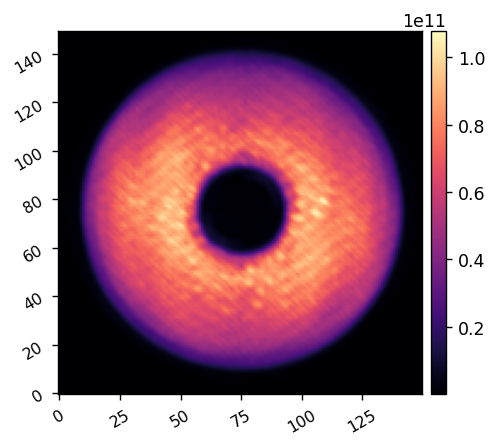

In [13]:
response_sum = np.sum(abs(response_cube), axis=(0,1))
misc.myimshow(response_sum.reshape(npsf,npsf))

# Create control matrix

In [34]:
response_cube.shape, nf, nh

((1540, 2, 4096), 516, 1024)

In [39]:
weight_mask = weight_map.flatten()>0
response_cube[:, :, weight_mask].shape

(1540, 2, 1436)

In [16]:
def construct_control_matrix(response_matrix, 
                             weight_map, 
                             nc1, nc2, 
                             nprobes=2, 
                             rcond1=1e-2, 
                             rcond2=1e-2, 
                             WLS=True, 
                             pca_modes=None):
    weight_mask = weight_map>0
    
    masked_matrix = response_matrix[:, :, weight_mask].reshape((response_matrix.shape[0], -1)).T
    print(masked_matrix.shape)
    
    nmodes = int(response_matrix.shape[0]/2)
    if WLS:
        print('Using Weighted Least Squares ')
        if nprobes==2:
            Wmatrix = np.diag(np.concatenate((weight_map[weight_mask], weight_map[weight_mask])))
        elif nprobes==3:
            Wmatrix = np.diag(np.concatenate((weight_map[weight_mask], weight_map[weight_mask], weight_map[weight_mask])))
        control_matrix_1 = utils.WeightedLeastSquares(masked_matrix[:,:nc1], Wmatrix, rcond=rcond1)
        control_matrix_2 = utils.WeightedLeastSquares(masked_matrix[:,nc1:], Wmatrix, rcond=rcond2)
    else: 
        print('Using Tikhonov Inverse')
        control_matrix_1 = utils.TikhonovInverse(masked_matrix[:,:nc1], rcond=rcond1)
        control_matrix_2 = utils.TikhonovInverse(masked_matrix[:,nc1:], rcond=rcond2)
        
    control_matrix = np.concatenate((control_matrix_1, control_matrix_2), axis=0)
    
    if pca_modes is not None:
        # Return the control matrix minus the pca_mode coefficients
        return control_matrix[0:-pca_modes.shape[0]]
    else:
        return control_matrix

In [15]:
reload(iefc)
control_matrix = construct_control_matrix(response_cube, 
                                                 weight_map.flatten(), 
                                               nc1=nf,
                                               nc2=nh,
                                                 rcond1=1e-1, 
                                                 rcond2=1e-1, 
                                                 nprobes=probe_modes.shape[0], pca_modes=None)
control_matrix.shape, nf, nh, control_mask.sum()*2

(26680, 2756)
Using Weighted Least Squares 


((2756, 26680), 1732, 1024, 26680)

In [25]:
reload(iefc)

reg_fun = iefc.construct_control_matrix
reg_conds = [[0, 10, 15, 20],
             [(1e-1, 1e-1), (1e-3, 1e-3), (1e-1, 1e-1), (1e-2, 1e-2)]]

# Run IEFC

Running I-EFC...
	Closed-loop iteration 1 / 50
(2756,)


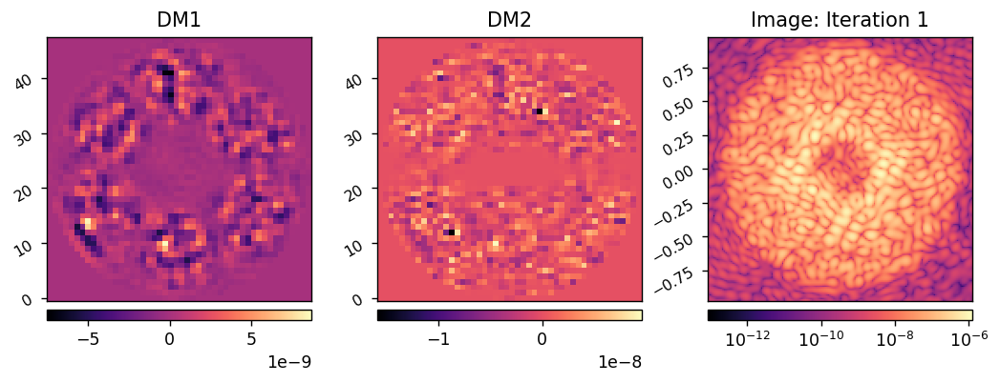

	Closed-loop iteration 2 / 50
(2756,)


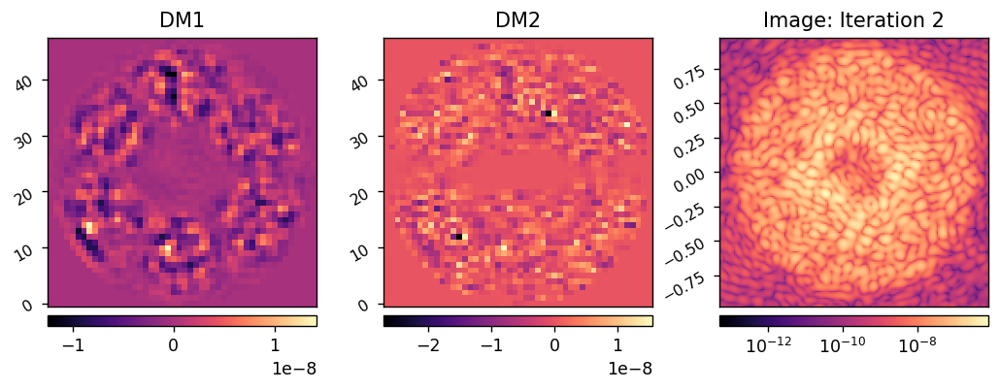

	Closed-loop iteration 3 / 50
(2756,)


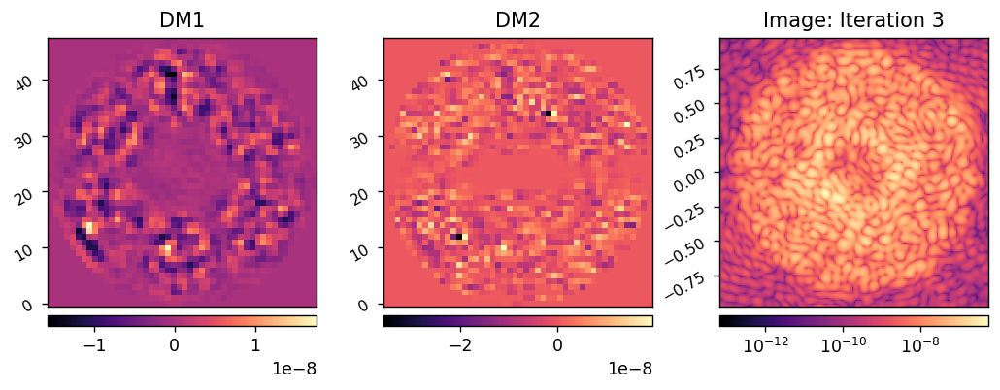

	Closed-loop iteration 4 / 50
(2756,)


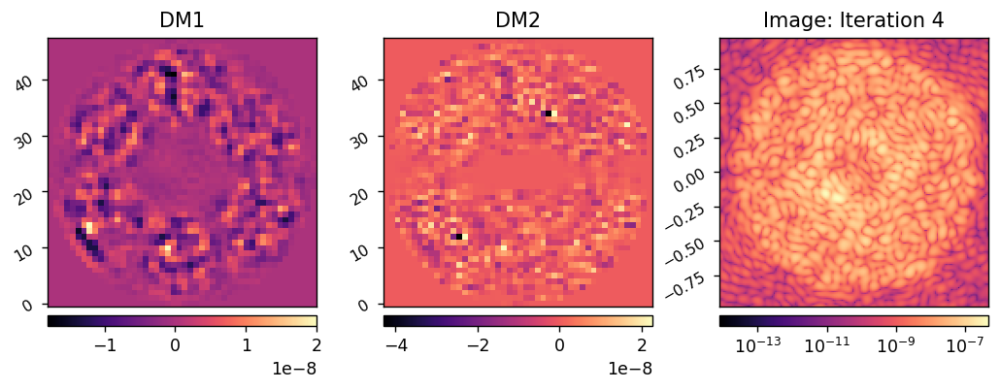

	Closed-loop iteration 5 / 50
(2756,)


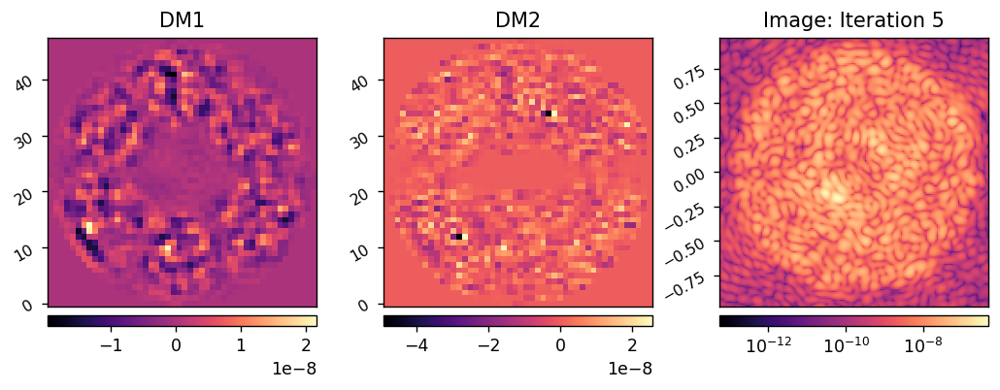

	Closed-loop iteration 6 / 50
(2756,)


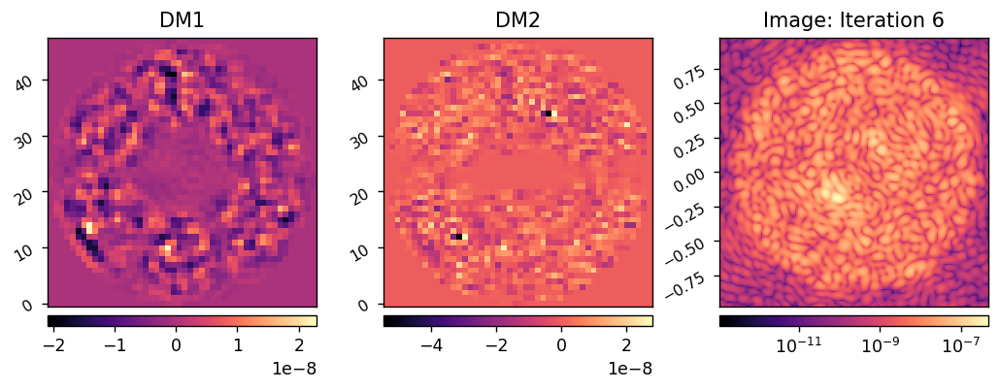

	Closed-loop iteration 7 / 50
(2756,)


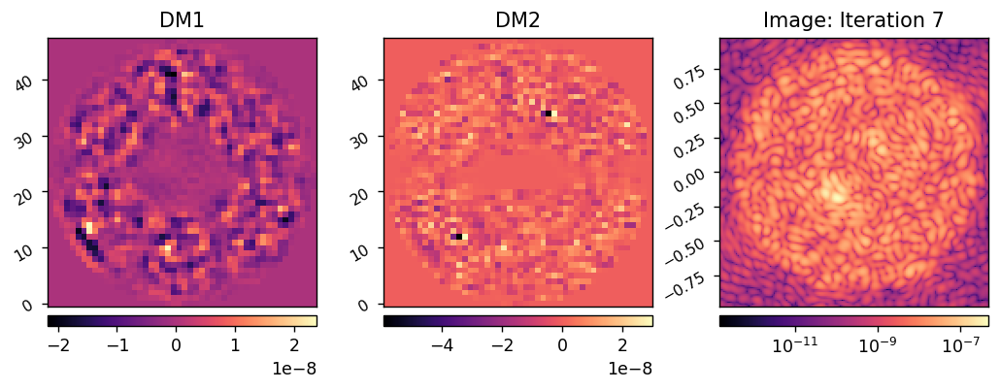

	Closed-loop iteration 8 / 50
(2756,)


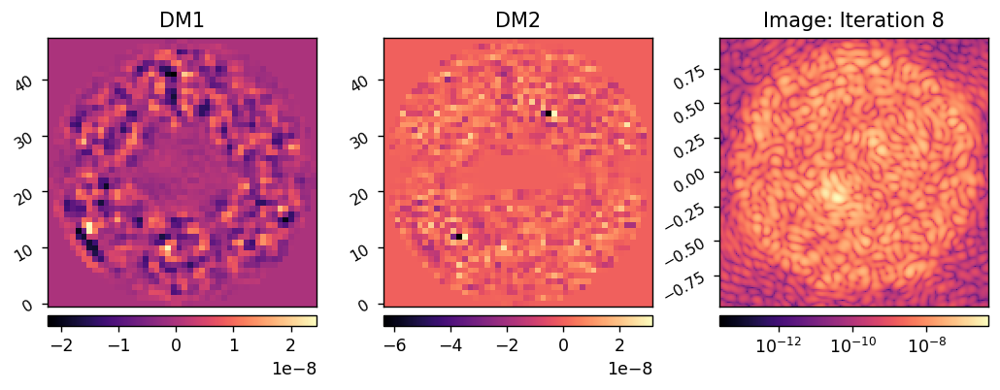

	Closed-loop iteration 9 / 50
(2756,)


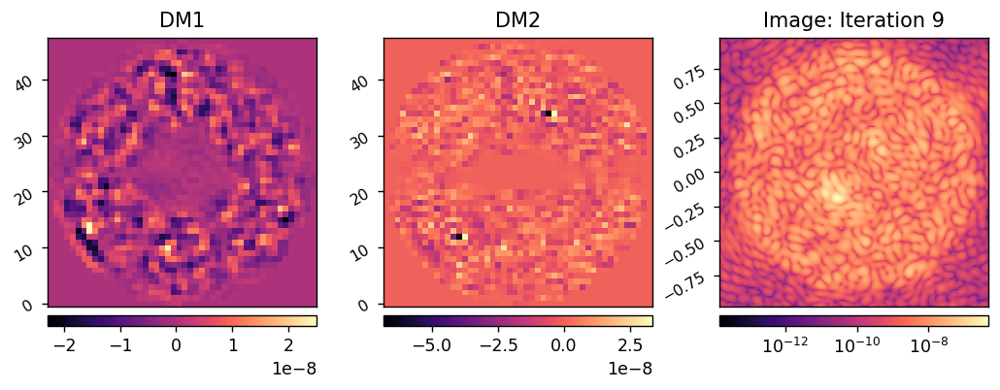

	Closed-loop iteration 10 / 50
(2756,)


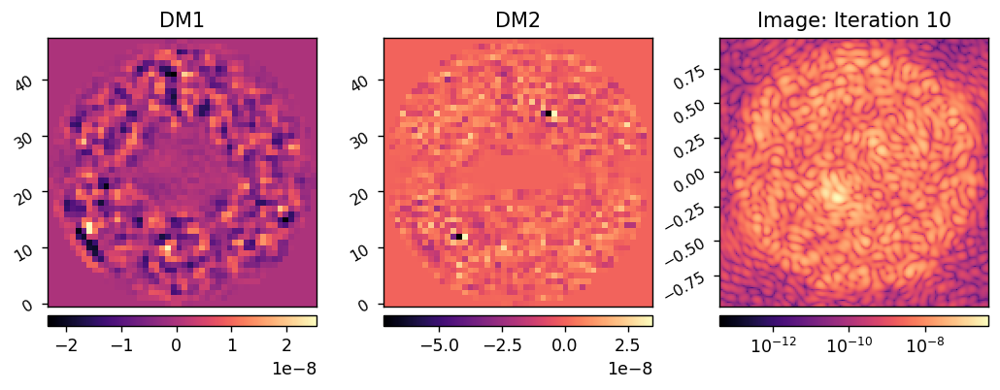

	Closed-loop iteration 11 / 50
(2756,)


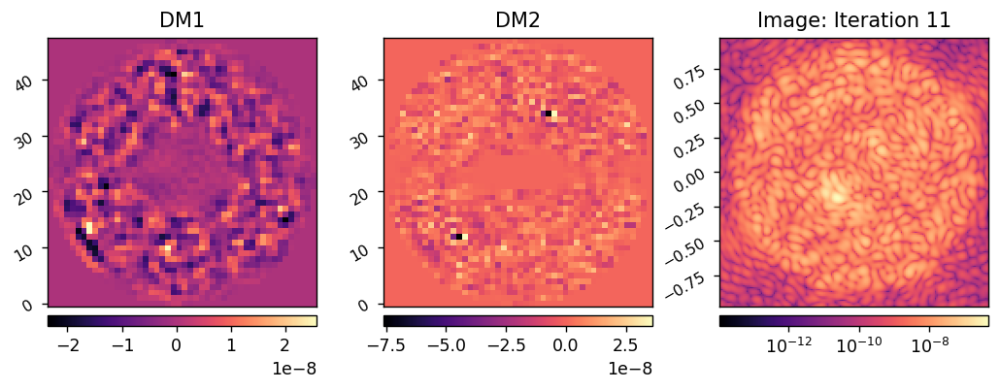

	Closed-loop iteration 12 / 50
(2756,)


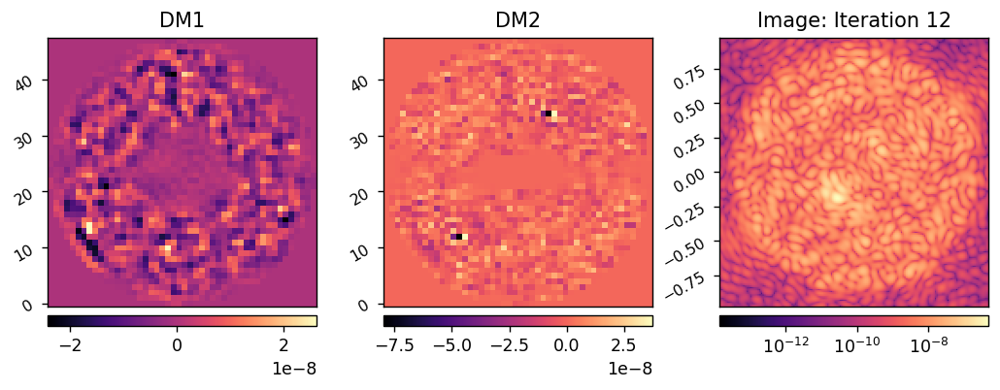

	Closed-loop iteration 13 / 50
(2756,)


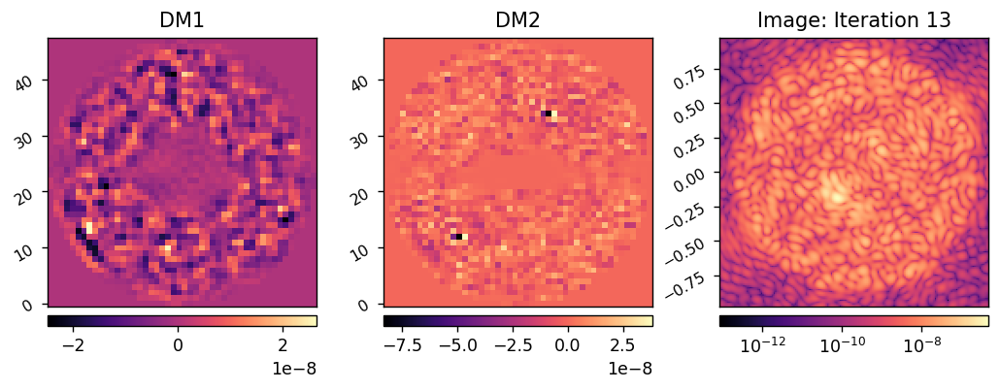

	Closed-loop iteration 14 / 50
(2756,)


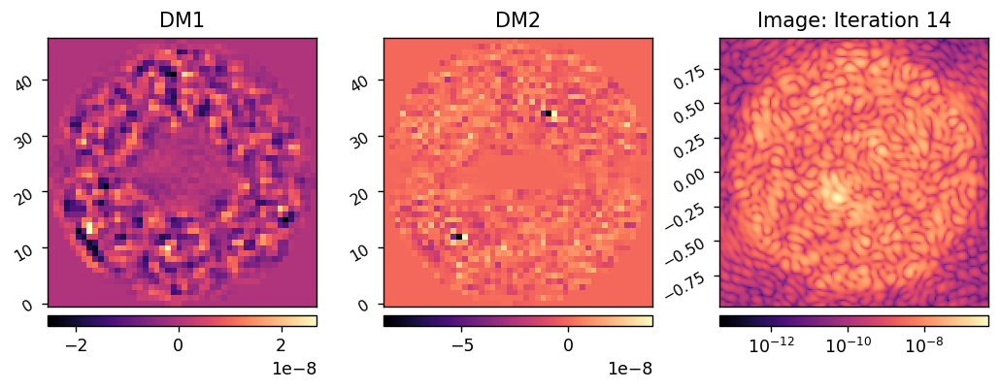

	Closed-loop iteration 15 / 50
(2756,)


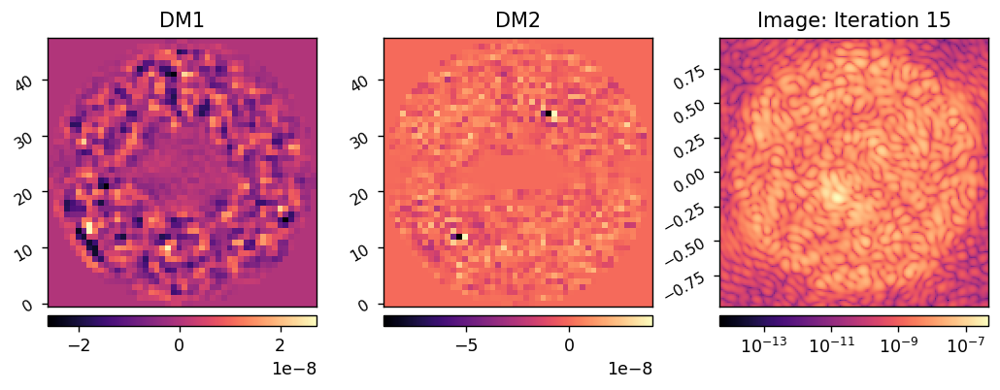

	Closed-loop iteration 16 / 50
(2756,)


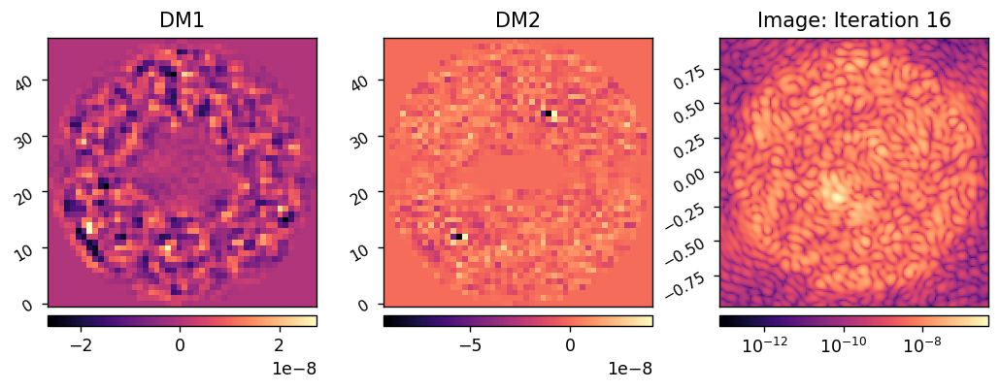

	Closed-loop iteration 17 / 50
(2756,)


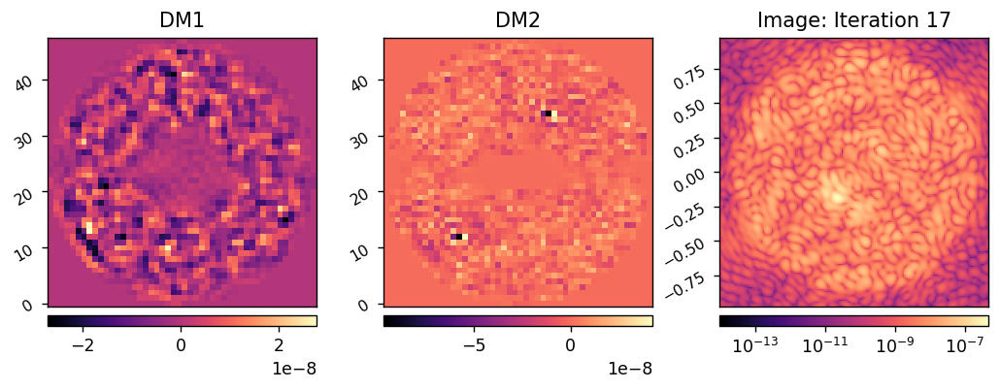

	Closed-loop iteration 18 / 50
(2756,)


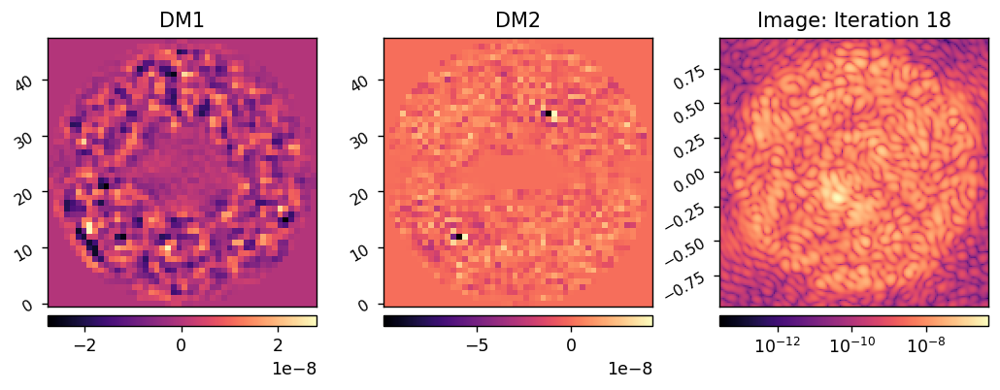

	Closed-loop iteration 19 / 50
(2756,)


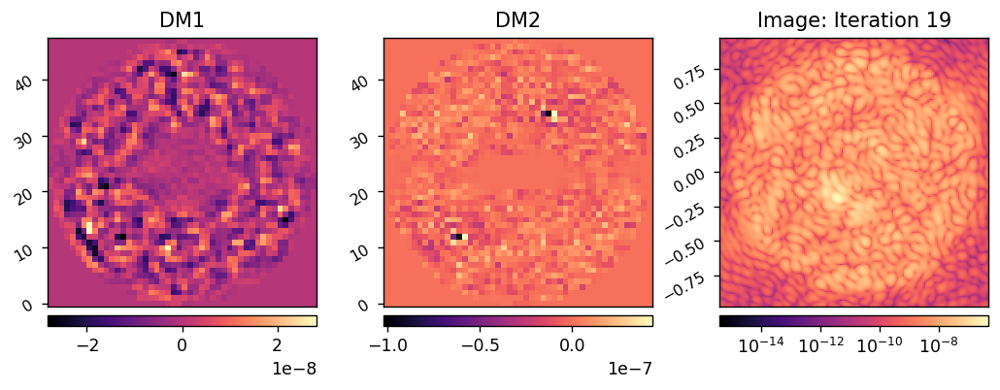

	Closed-loop iteration 20 / 50
(2756,)


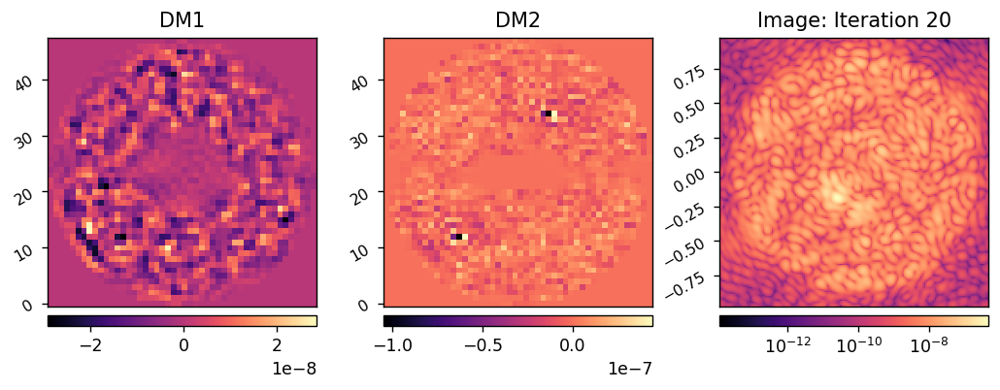

	Closed-loop iteration 21 / 50
(2756,)


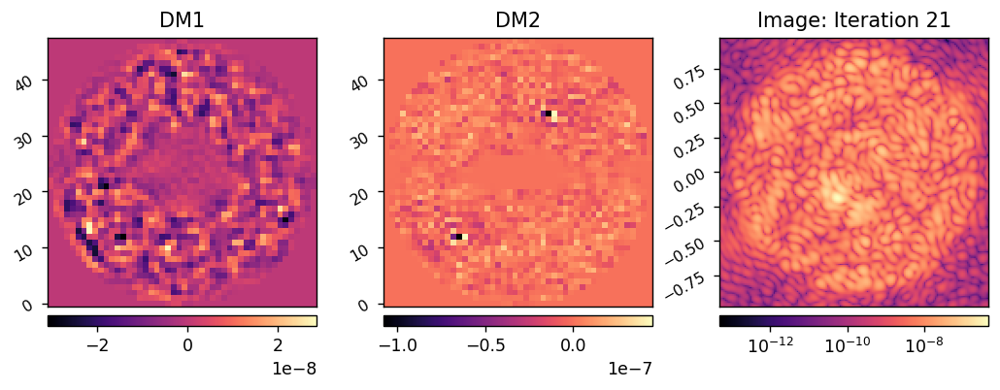

	Closed-loop iteration 22 / 50
(2756,)


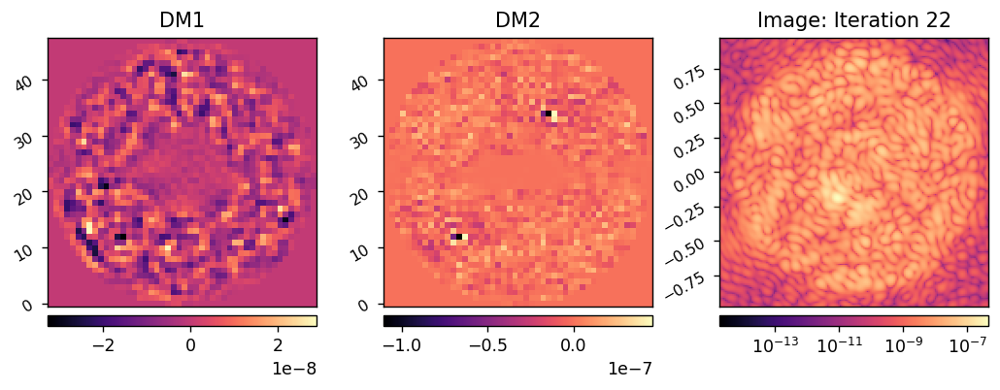

	Closed-loop iteration 23 / 50
(2756,)


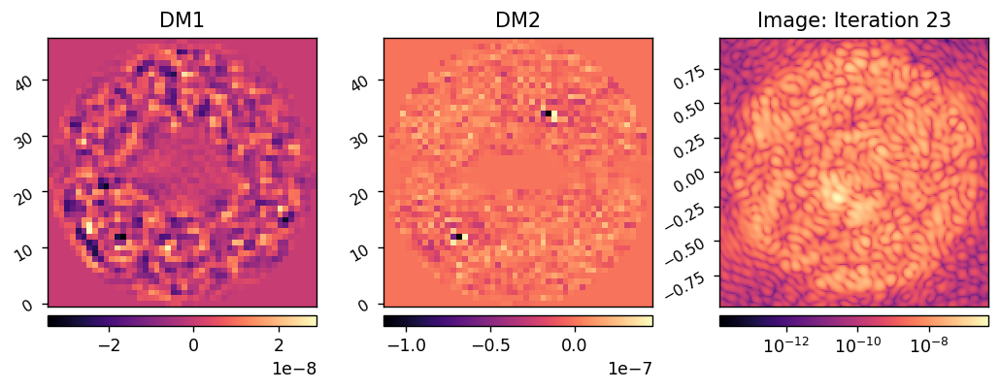

	Closed-loop iteration 24 / 50
(2756,)


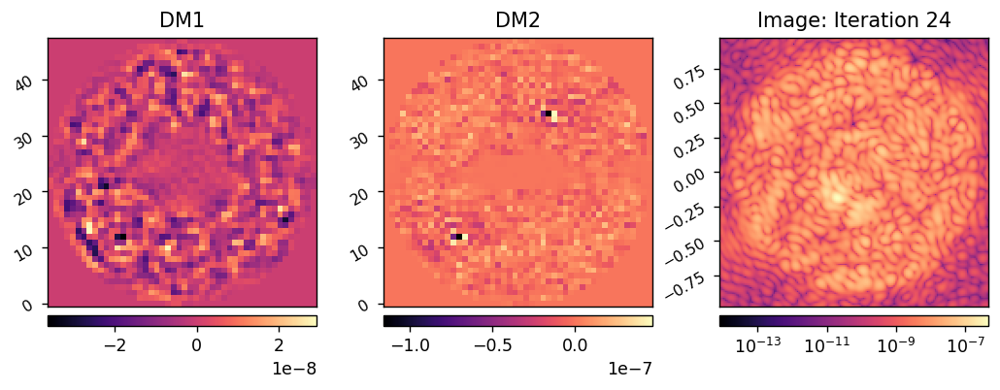

	Closed-loop iteration 25 / 50
(2756,)


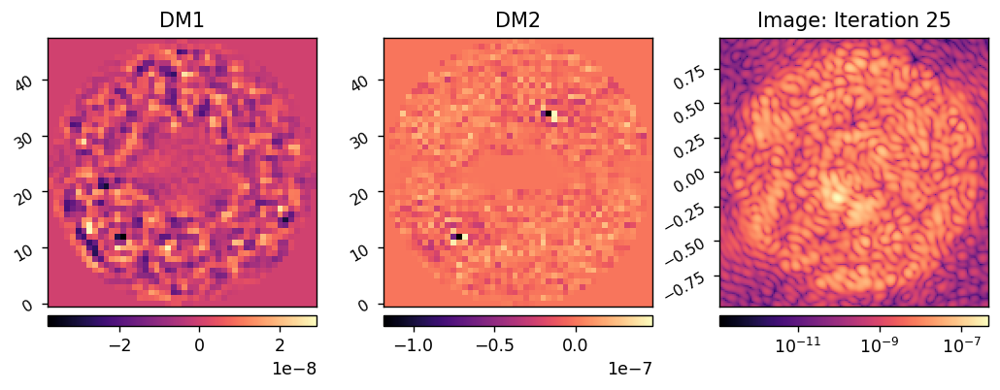

	Closed-loop iteration 26 / 50
(2756,)


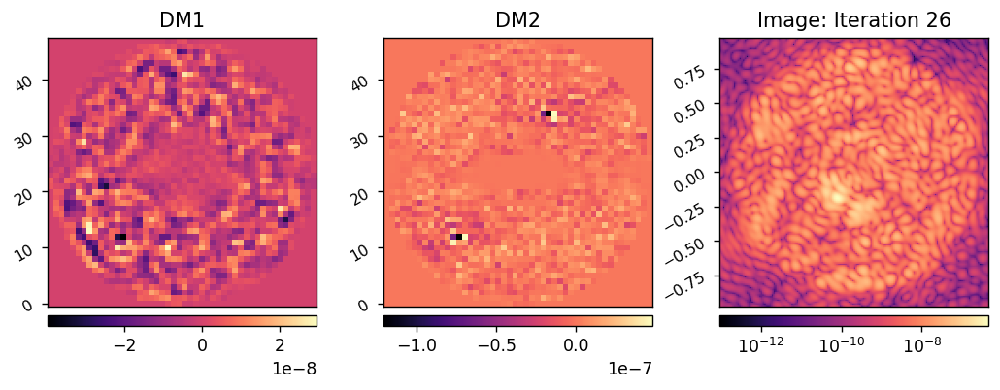

	Closed-loop iteration 27 / 50
(2756,)


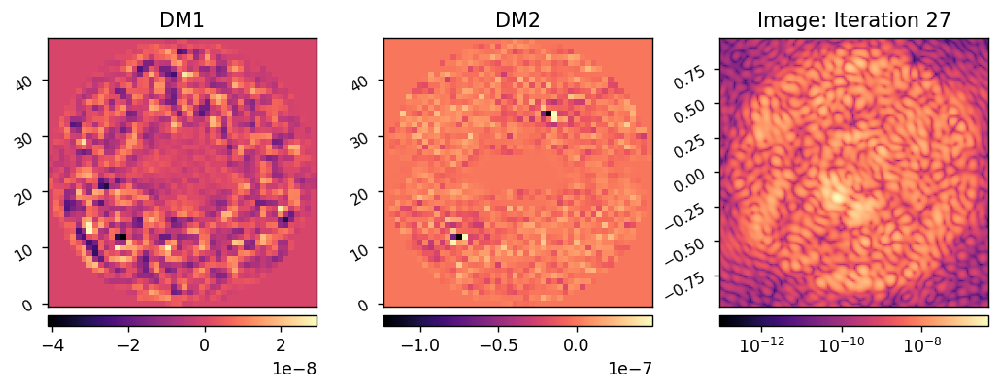

	Closed-loop iteration 28 / 50
(2756,)


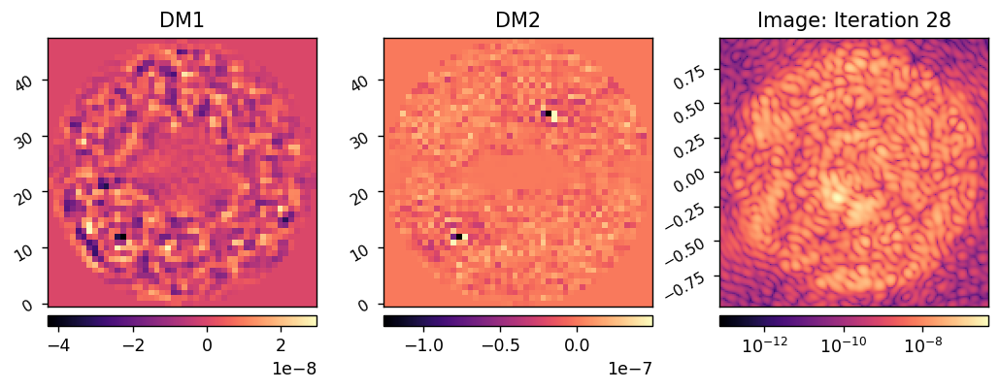

	Closed-loop iteration 29 / 50
(2756,)


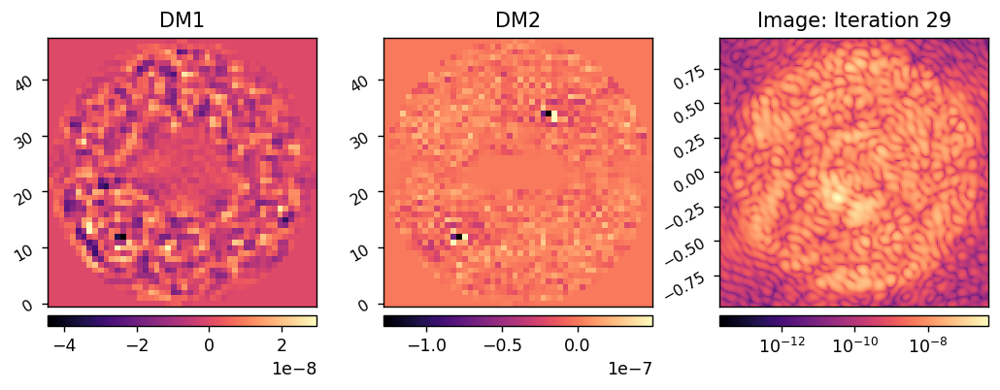

	Closed-loop iteration 30 / 50
(2756,)


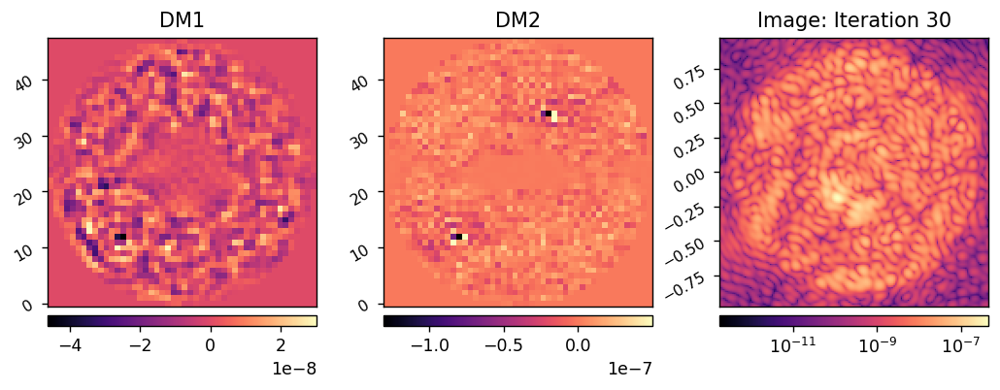

	Closed-loop iteration 31 / 50
(2756,)


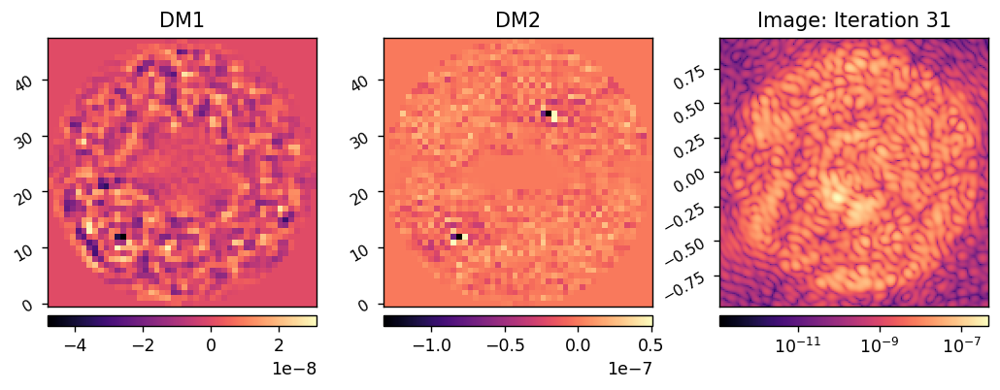

	Closed-loop iteration 32 / 50
(2756,)


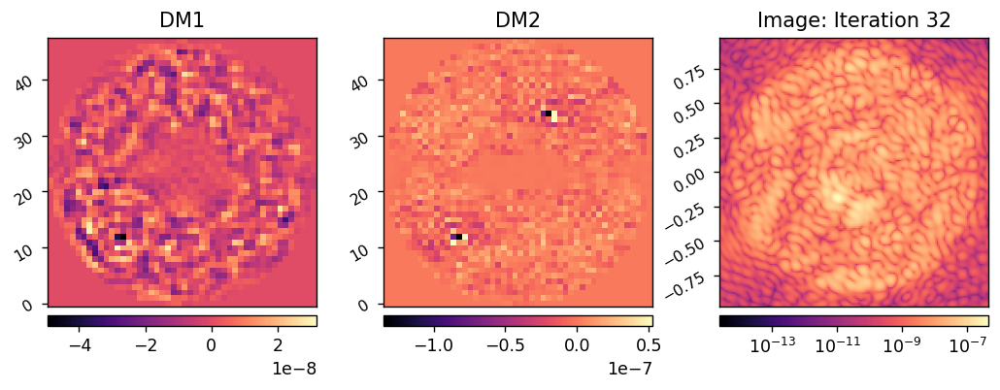

	Closed-loop iteration 33 / 50
(2756,)


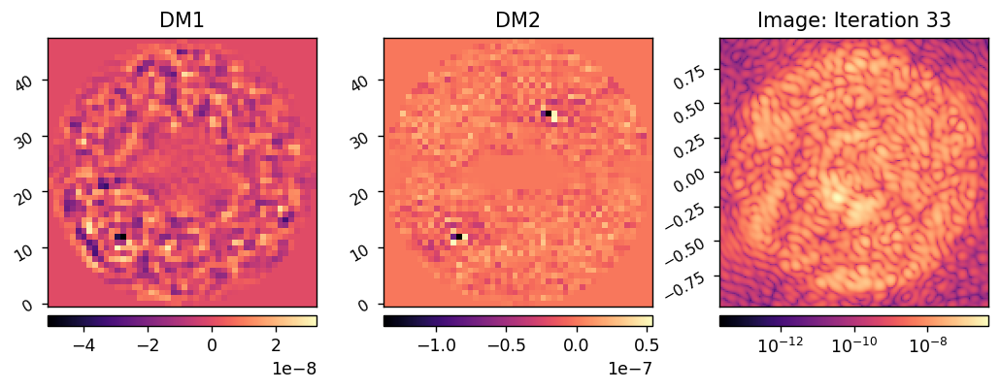

	Closed-loop iteration 34 / 50
(2756,)


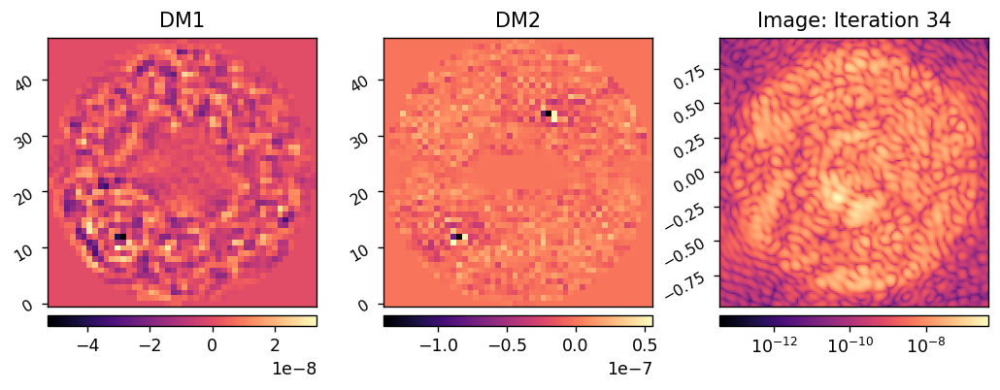

	Closed-loop iteration 35 / 50
(2756,)


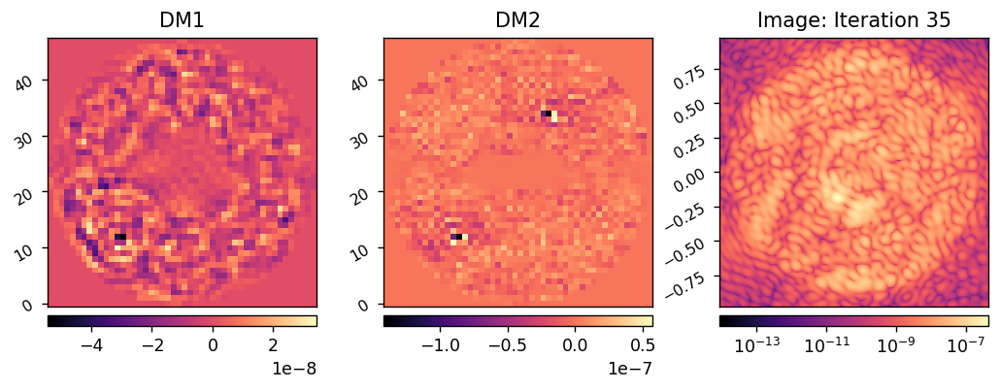

	Closed-loop iteration 36 / 50
(2756,)


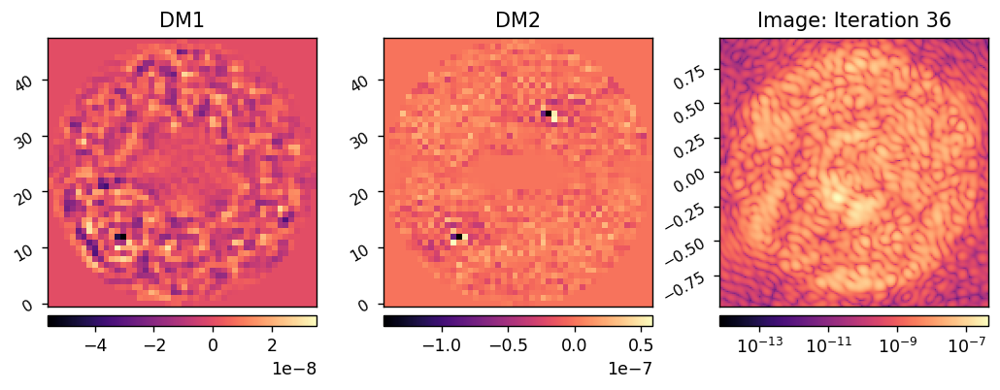

	Closed-loop iteration 37 / 50
(2756,)


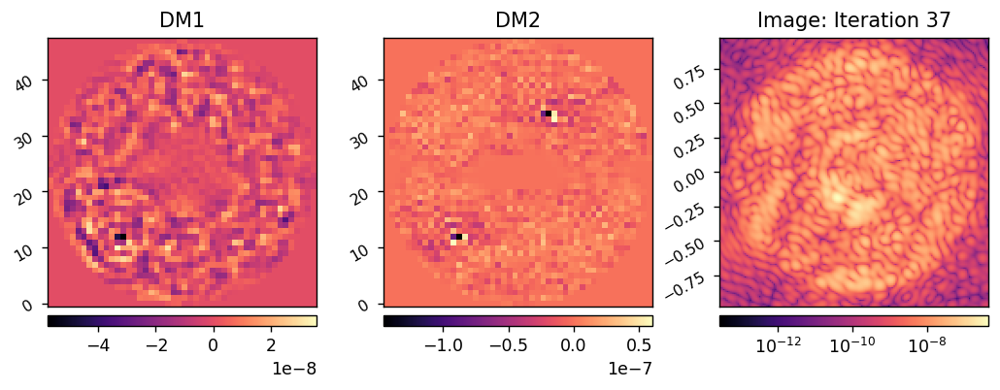

	Closed-loop iteration 38 / 50
(2756,)


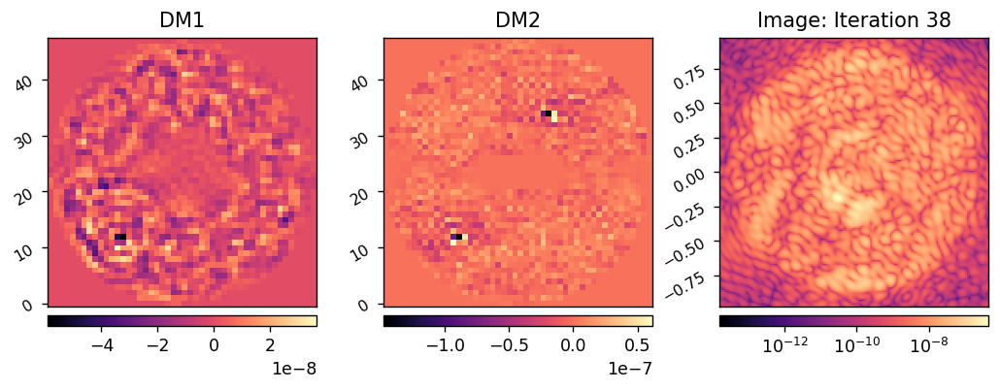

	Closed-loop iteration 39 / 50
(2756,)


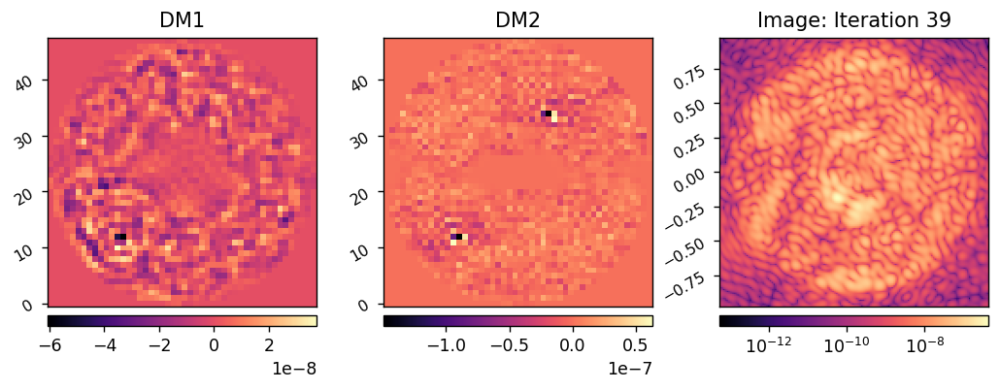

	Closed-loop iteration 40 / 50
(2756,)


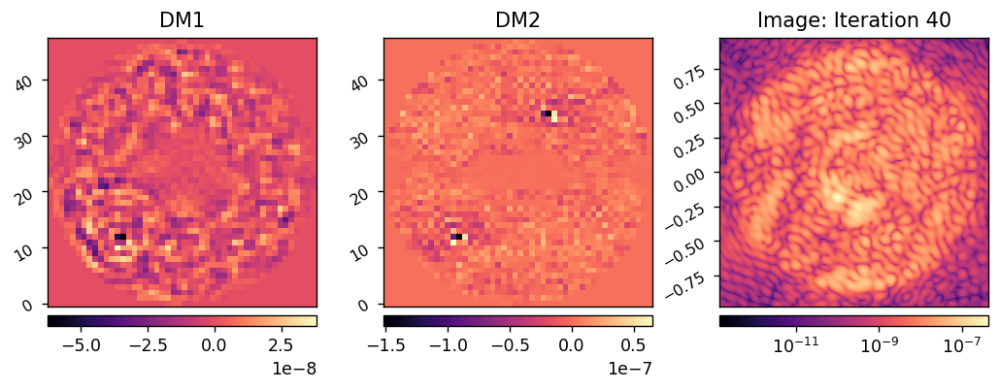

	Closed-loop iteration 41 / 50
(2756,)


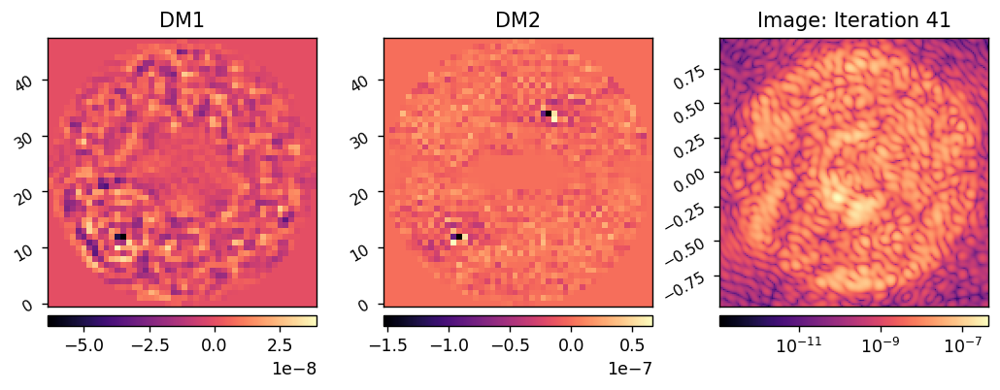

	Closed-loop iteration 42 / 50
(2756,)


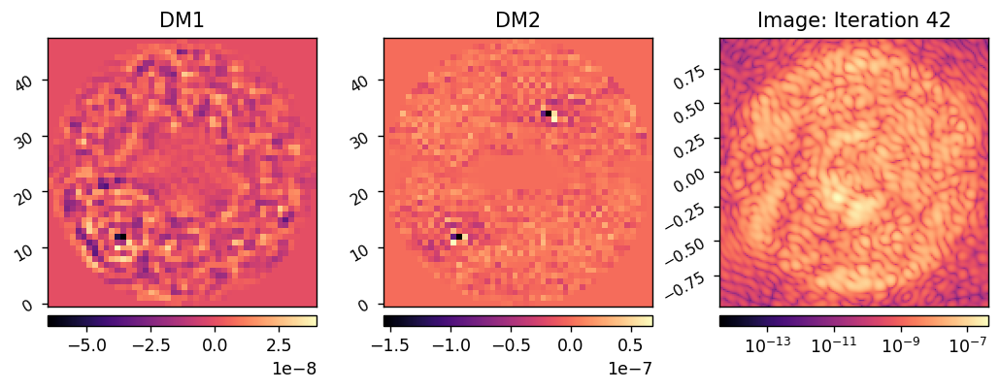

	Closed-loop iteration 43 / 50
(2756,)


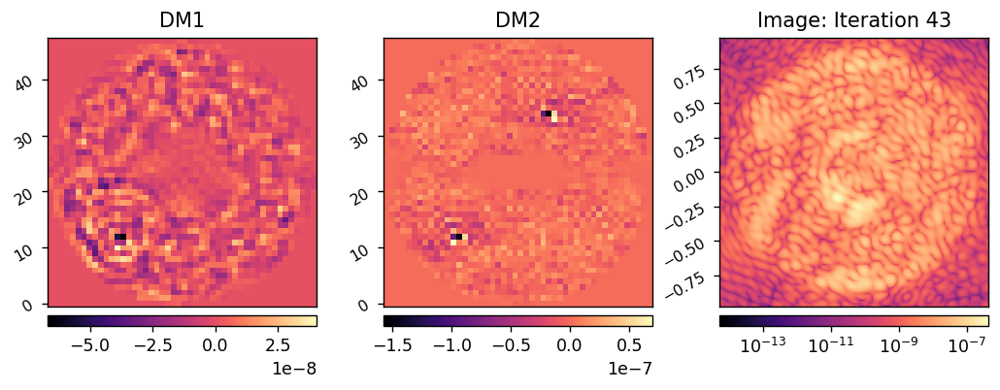

	Closed-loop iteration 44 / 50
(2756,)


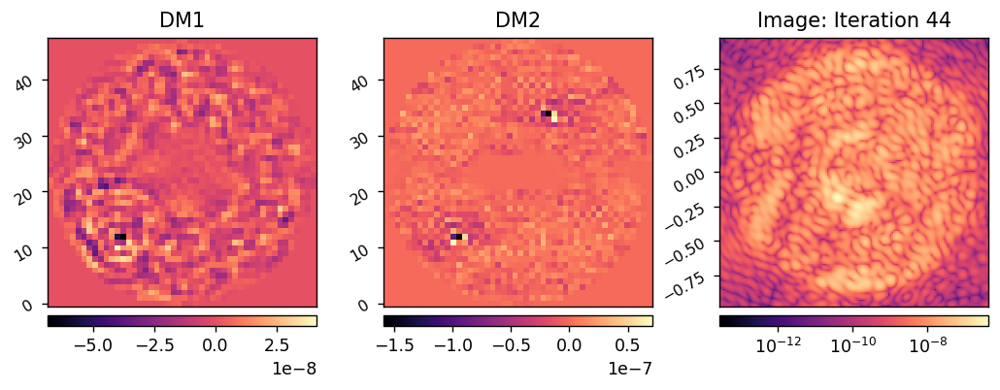

	Closed-loop iteration 45 / 50
(2756,)


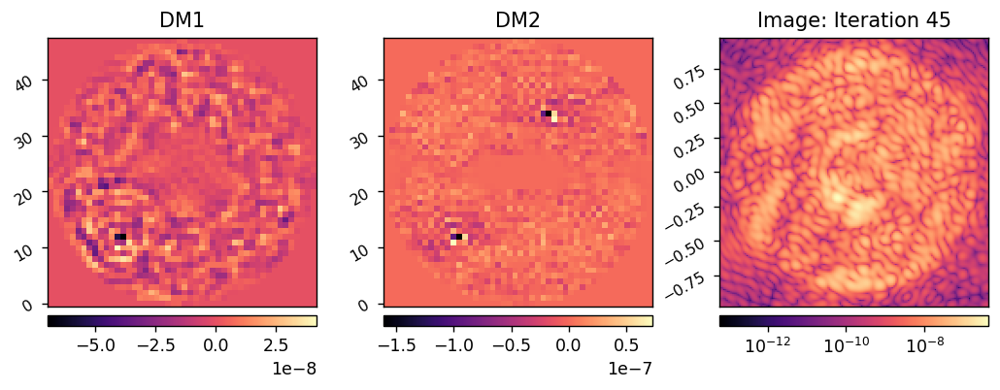

	Closed-loop iteration 46 / 50
(2756,)


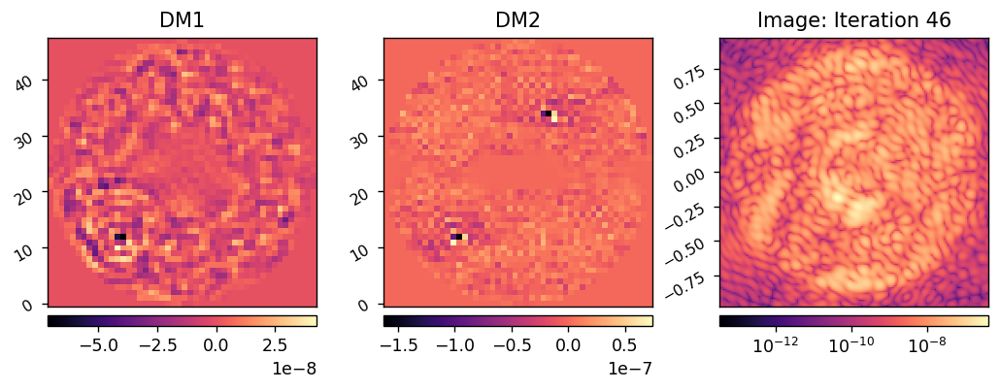

	Closed-loop iteration 47 / 50
(2756,)


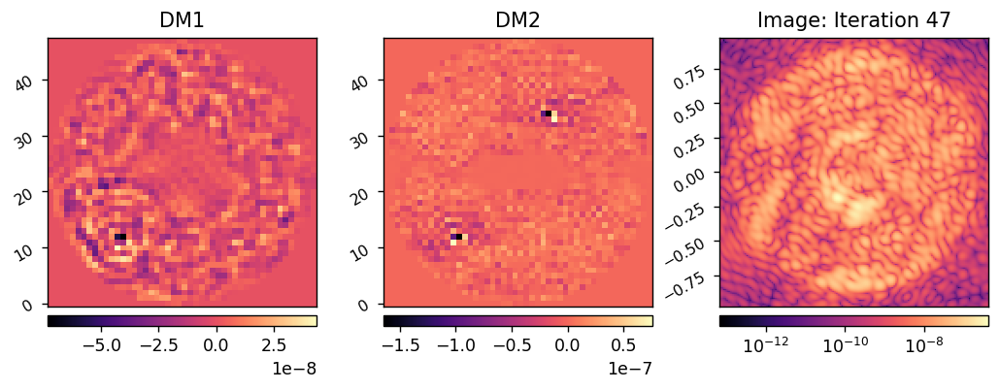

	Closed-loop iteration 48 / 50
(2756,)


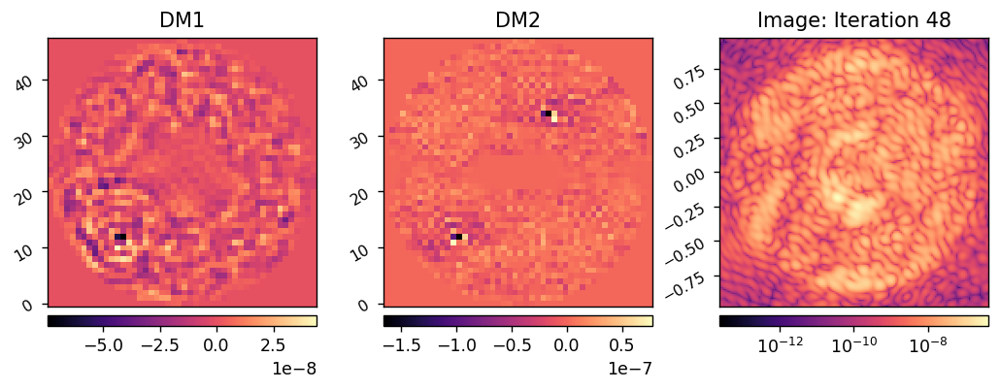

	Closed-loop iteration 49 / 50
(2756,)


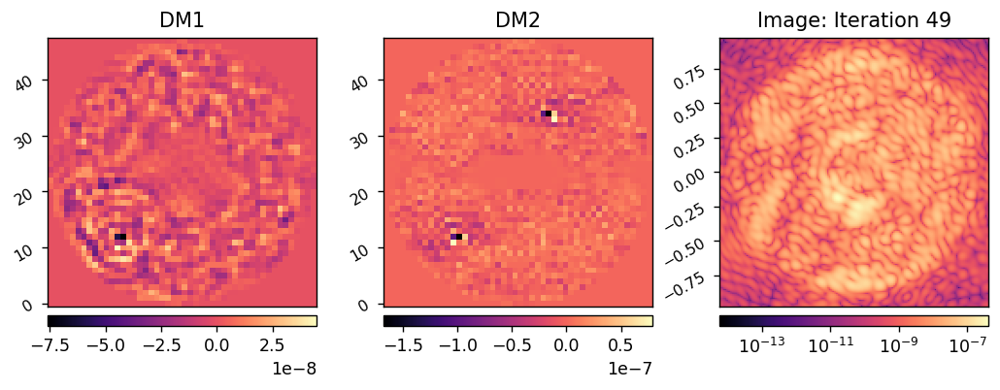

	Closed-loop iteration 50 / 50
(2756,)


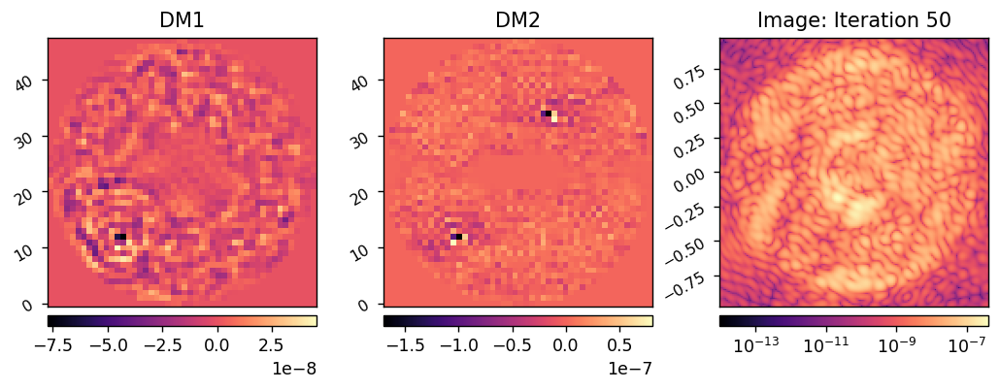

I-EFC loop completed in 115.230s.


In [18]:
reload(iefc)

sysi.reset_dms()

images, dm1_commands, dm2_commands = iefc.run(sysi, 
                                              control_matrix,
#                                               reg_fun,reg_conds,response_cube, 
                                              probe_modes, 
                                              probe_amp, 
                                              fourier_modes,
                                              had_modes,
                                              weight_map, 
                                              num_iterations=50, 
                                              loop_gain=0.2, leakage=0.0,
                                              display_all=True,
                                             )